In [1]:
# from tensorflow import keras
# from tensorflow.keras import applications
# # from keras.backend.tensorflow_backend import set_session
# import tensorflow as tf
# config = tf.compat.v1.ConfigProto()
# config.gpu_options.allow_growth = True  # dynamically grow the memory used on the GPU
# config.log_device_placement = True  # to log device placement (on which device the operation ran)
# sess = tf.compat.v1.Session(config=config)
# # set_session(sess)  # set this TensorFlow session as the default session for Keras

# from tensorflow.keras.layers import Dense
# from tensorflow.keras.models import Model 
# from tensorflow.keras import optimizers
# from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, TensorBoard, EarlyStopping

In [2]:
from facenet_pytorch import MTCNN
from PIL import Image
import matplotlib.pyplot as plt
import torch
from imutils.video import FileVideoStream
from custom_utils import return_all_video_paths
import cv2
import time
import glob
import os
import json
import random
import numpy as np
import imutils
import threading
from IPython.display import display
from os.path import join
from tqdm.notebook import tqdm

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [3]:
class FastMTCNN(object):
    """Fast MTCNN implementation."""
    
    def __init__(self, stride, resize=1, *args, **kwargs):
        """Constructor for FastMTCNN class.
        
        Arguments:
            stride (int): The detection stride. Faces will be detected every `stride` frames
                and remembered for `stride-1` frames.
        
        Keyword arguments:
            resize (float): Fractional frame scaling. [default: {1}]
            *args: Arguments to pass to the MTCNN constructor. See help(MTCNN).
            **kwargs: Keyword arguments to pass to the MTCNN constructor. See help(MTCNN).
        """
        self.stride = stride
        self.resize = resize
        self.mtcnn = MTCNN(*args, **kwargs)
        
    def __call__(self, frames):
        """Detect faces in frames using strided MTCNN."""
        frames_original = frames.copy()
        if self.resize != 1:
            frames = [f.resize([int(d * self.resize) for d in f.size]) for f in frames]
                      
        boxes, probs = self.mtcnn.detect(frames[::self.stride])

        faces = []
        for i, frame in enumerate(frames_original):
            box_ind = int(i / self.stride)
            # Eliminate with 2 or more faces
            if boxes[box_ind] is None:
                continue
            elif len(boxes[box_ind]) > 1:
                return []
            for box in boxes[box_ind]:
                faces.append(np.array(frame.crop(box/self.resize)))
        
        return faces

In [4]:
def run_detection(fast_mtcnn, all_videos_annotations):
    frames = []
    face_objects = []
    frames_processed = 0
    faces_detected = 0
    batch_size = 60
    start = time.time()

#     for filename, annotation in tqdm(all_videos_annotations):
    for filename, annotation in all_videos_annotations:
        last_frame = False
        faces_imgs = []
        
        v_cap = FileVideoStream(filename).start()
        v_len = int(v_cap.stream.get(cv2.CAP_PROP_FRAME_COUNT))

        for j in range(v_len):
            frame = v_cap.read()
            if frame is not None:
                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                frame = Image.fromarray(frame)

                frames.append(frame)
            else:
                last_frame = True

            if len(frames) >= batch_size or j == v_len - 1 or last_frame:

                faces = fast_mtcnn(frames)

                frames_processed += len(frames)
                faces_detected += len(faces)
                faces_imgs.extend(faces)
                frames = []

#                 print(
#                     f'Frames per second: {frames_processed / (time.time() - start):.3f},',
#                     f'faces detected: {faces_detected}\r',
#                     end=''
#                 )
            if last_frame:
                break
        
        face_objects.append({'faces': faces_imgs, 'annotation': int(annotation), 'filename': filename})
        
        v_cap.stop()
    
    return face_objects

In [5]:
def add_resized_faces_to_object(face_objects):
    for face_object in face_objects:
        args = {}
        new_shape = (224,224)
        resized_key = 'face_{}_{}'.format(new_shape[0], new_shape[1])
        face_object[resized_key] = []
        for idx, face in enumerate(face_object['faces']):
            img = face
            if np.argmax(img.shape[:2]) == 0:
                args['height'] = new_shape[0]
            else:
                args['width'] = new_shape[1]
            try:
                resized_img = imutils.resize(img, **args)
                if np.argmax(img.shape[:2]) == 0:
                    diff = new_shape[1] - resized_img.shape[1]
                    resized_img = np.pad(resized_img, ((0,0), (0,diff), (0,0)), 'constant', constant_values=0)
                else:
                    diff = new_shape[0] - resized_img.shape[0]
                    resized_img = np.pad(resized_img, ((0,diff), (0,0), (0,0)), 'constant', constant_values=0)
                face_object[resized_key].append(resized_img)
    
            except Exception as e:
                print(e)
#                 print(face_object['filename'], idx)
#                 break
    return face_objects

In [6]:
fast_mtcnn = FastMTCNN(
    stride=4,
    resize=0.25,
    margin=14,
    factor=0.6,
    keep_all=True,
    device=device
)

In [7]:
all_videos_annotations = return_all_video_paths('../deepfake_train_full')

In [8]:
def get_faces(shared_list, videos_annotations, nr_of_videos_to_process=10, \
              pick_nr_of_faces_per_video=30):
    while True:
        if len(shared_list) < nr_of_videos_to_process*nr_of_videos_to_process*10:
            temp_list = []
            selected_videos_annotations = random.choices(videos_annotations, k=nr_of_videos_to_process)
            face_objects = run_detection(fast_mtcnn, np.array(selected_videos_annotations))
            face_objects = add_resized_faces_to_object(face_objects)
            for face_object in face_objects:
                if len(face_object['face_224_224']) > pick_nr_of_faces_per_video:
                    random_pick = random.choices(face_object['face_224_224'], k=pick_nr_of_faces_per_video)
#                     t = [(x, face_object['annotation']) for x in random_pick]
#                     for x in t:
#                         temp_list.append(x)
                    temp_list.extend([(x, face_object['annotation']) for x in random_pick])
            for x in temp_list:
                shared_list.append(x)
        else:
            time.sleep(0.001)

In [9]:
train_list = []
val_split = int(len(all_videos_annotations)*0.9)
p_train = threading.Thread(target=get_faces, \
            args=(train_list, all_videos_annotations[:val_split], 40, 40))
p_train.start()


In [10]:
len(train_list)

0

In [11]:
def generator(shared_list, batch_size):
    while True:
        if len(shared_list) > batch_size:
            X = []
            Y = []
            random.shuffle(shared_list)
            for i in range(batch_size):
                x, y = shared_list.pop()

                X.append(x/255)
                Y.append(y)
            yield (np.array(X).reshape((batch_size,3,224,224)), \
                   np.expand_dims(np.array(Y), axis=1))
        else:
            time.sleep(0.01)

In [12]:
gen_train = generator(train_list, 16)

In [13]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy

In [14]:
model_ft = models.resnet101(pretrained=True)
num_ftrs = model_ft.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_ft.fc = nn.Linear(num_ftrs, 1)

model_ft = model_ft.to(device)

criterion = nn.BCEWithLogitsLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [15]:
def train_model(model, criterion, optimizer, scheduler, generator, 
                num_epochs=25, steps_per_epoch=500):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    best_loss = 9999

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        model.train()  # Set model to training mode

        running_loss = 0.0
        running_corrects = 0

        # Iterate over data.
        step = 0
        for inputs, labels in generator:
            inputs = torch.from_numpy(inputs).float().to(device)
            labels = torch.from_numpy(labels).float().to(device)

            step = step + 1
            # zero the parameter gradients
            optimizer.zero_grad()

            # forward
            # track history if only in train
            with torch.set_grad_enabled(True):
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)
#                 loss = criterion(outputs) - labels

                loss.backward()
                optimizer.step()

            # statistics
            running_loss += loss.item() * inputs.size(0)
            print("Step: {} - Loss {}".format(step, running_loss / step), end="\r")
#             print(running_loss / step)
            running_corrects += torch.sum(preds == labels.data)
            if step > steps_per_epoch:
                break
        scheduler.step()

        epoch_loss = running_loss / steps_per_epoch
        epoch_acc = running_corrects / steps_per_epoch

        print('Loss: {:.4f} Acc: {:.4f}'.format(
            epoch_loss, epoch_acc))

        # deep copy the model
        if epoch_loss < best_loss:
#             model.save_state_dict('mytraining.pt')
            torch.save(model.state_dict(), 'mytraining.pt')
            best_loss = epoch_loss
            best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [16]:
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       gen_train,
                       num_epochs=50,
                       steps_per_epoch=500)

Epoch 0/49
----------
Loss: 3.0305 Acc: 41.00000371649672

Epoch 1/49
----------
Loss: 2.3623 Acc: 46.00008475347125

Epoch 2/49
----------
Loss: 2.0388 Acc: 36.00003766203875

Epoch 3/49
----------
Loss: 2.2069 Acc: 43.00002338377273

Epoch 4/49
----------
Loss: 2.3507 Acc: 42.00003215729955

Epoch 5/49
----------
Loss: 2.4923 Acc: 40.00009444057534

Epoch 6/49
----------


ValueError: cannot reshape array of size 16 into shape (16,3,224,224)

In [22]:
for X, Y in gen_train:
    break

In [23]:
X.shape

(8, 3, 224, 224)

In [26]:
X.shape

(8, 3, 224, 224)

In [28]:
np.expand_dims(Y, axis=1).shape

(8, 1)

In [22]:
for x in range(10):
    print("Progress {}".format(x / 10), end="\r")
    time.sleep(1)

KeyboardInterrupt: 

In [21]:
x / 10

0.3

In [13]:
model = applications.mobilenet_v2.MobileNetV2(include_top=True, weights='imagenet', input_shape=(224, 224, 3))
x = model.output
predictions = Dense(1, activation="sigmoid")(x)
model_final = Model(inputs = model.input, outputs = predictions)
model_final.compile(loss = "mean_squared_logarithmic_error", \
                    optimizer = optimizers.SGD(lr=0.0001, momentum=0.9), metrics=["accuracy"])

In [14]:
checkpoint = ModelCheckpoint("MobileNetV2_retrain.h5", monitor='accuracy', verbose=1, \
                             save_best_only=True, save_weights_only=False, mode='auto', save_freq=1)
reduce_lr = ReduceLROnPlateau(monitor='accuracy', factor=0.1, patience=7, verbose=0, \
                              mode='auto', min_delta=0.0001, cooldown=0, min_lr=0)

In [18]:
model_final.fit_generator(
  gen_train,
  steps_per_epoch = 500,
  epochs = 1000,
#   validation_data = gen_val,
#   validation_steps = 5,
  callbacks = [reduce_lr, checkpoint])

Epoch 1/1000


ValueError: Error when checking input: expected input_1 to have 4 dimensions, but got array with shape (32, 1)

In [17]:
model_final.fit_generator(
  gen_train,
  steps_per_epoch = 500,
  epochs = 1000,
#   validation_data = gen_val,
#   validation_steps = 5,
  callbacks = [reduce_lr, checkpoint])

Epoch 1/1000


ValueError: Error when checking input: expected input_1 to have 4 dimensions, but got array with shape (32, 1)

In [19]:
model_final.fit_generator(
  gen_train,
  steps_per_epoch = 500,
  epochs = 1000,
#   validation_data = gen_val,
#   validation_steps = 5,
  callbacks = [reduce_lr, checkpoint])

Epoch 1/1000


StopIteration: 

In [33]:
model_final.fit_generator(
  gen_train,
  steps_per_epoch = 500,
  epochs = 1000,
#   validation_data = gen_val,
#   validation_steps = 5,
  callbacks = [reduce_lr, checkpoint])

Epoch 1/1000


ValueError: Error when checking input: expected input_1 to have 4 dimensions, but got array with shape (32, 1)

In [15]:
from tensorflow.python.platform import build_info as tf_build_info
print(tf_build_info.cuda_version_number)
# 9.0 in v1.10.0
print(tf_build_info.cudnn_version_number)

10.0
7.6


In [15]:
for X, Y in gen_train:
    break

In [16]:
X.shape

(32, 224, 224, 3)

In [17]:
np.array(Y)

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 0, 1])

In [18]:
model_final.fit(X,np.array(Y))

Train on 32 samples
32/32 [==============================] - 10s 327ms/sample


UnknownError:  Failed to get convolution algorithm. This is probably because cuDNN failed to initialize, so try looking to see if a warning log message was printed above.
	 [[node model/Conv1/Conv2D (defined at C:\Users\Anti\Anaconda3\envs\test\lib\site-packages\tensorflow_core\python\framework\ops.py:1751) ]] [Op:__inference_distributed_function_14725]

Function call stack:
distributed_function


In [23]:
import ctypes
ctypes.WinDLL("cudnn64_7.dll")

<WinDLL 'cudnn64_7.dll', handle 7ffacae60000 at 0x2876456a588>

In [19]:
tf.test.is_built_with_cuda()

True

In [23]:
tf.test.is_gpu_available(cuda_only=False, min_cuda_compute_capability=None)

True

## Extract audio from video

### Speech recogniziton. SLOW

In [16]:
import speech_recognition as sr

In [23]:
command2mp3 = 'ffmpeg -i ../deepfake_train_full\\dfdc_train_part_46\\dfdc_train_part_46\\aqsgzoxyok.mp4 \
    ../deepfake_train_full_audio\\aqsgzoxyok.wav'

In [24]:
os.system(command2mp3)

0

In [17]:
r = sr.Recognizer()

In [25]:
with sr.AudioFile('../deepfake_train_full_audio\\aqsgzoxyok.wav') as source:
    audio = r.record(source)

In [27]:
print("Sphinx thinks you said " + r.recognize_sphinx(audio))

Sphinx thinks you said among those shoes listen to what the that are that calls for a car that the field in one move


In [28]:
audio

In [18]:
audio = sr.AudioFile('../deepfake_train_full_audio\\aqsgzoxyok.mp3')

In [21]:
audio = r.record(source, duration=100)

AssertionError: Audio source must be entered before recording, see documentation for ``AudioSource``; are you using ``source`` outside of a ``with`` statement?

In [20]:
print(r.recognize_google(audio))

AssertionError: ``audio_data`` must be audio data

### Plot signal

In [68]:
command2mp3 = 'ffmpeg -i ../deepfake_train_full\\dfdc_train_part_26\\dfdc_train_part_26\\gpdtoamvkz.mp4 \
    ../deepfake_train_full_audio\\gpdtoamvkz.wav'
os.system(command2mp3)

command2mp3 = 'ffmpeg -i ../deepfake_train_full\\dfdc_train_part_26\\dfdc_train_part_26\\yojgjueqta.mp4 \
    ../deepfake_train_full_audio\\yojgjueqta.wav'
os.system(command2mp3)

0

C:\Users\Anti\Anaconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
  if sys.path[0] == '':
C:\Users\Anti\Anaconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  if sys.path[0] == '':


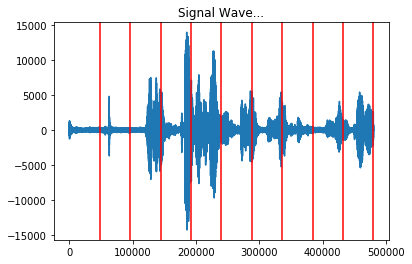

C:\Users\Anti\Anaconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:31: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
C:\Users\Anti\Anaconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:31: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


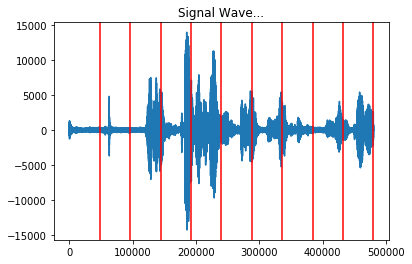

In [21]:
import matplotlib.pyplot as plt
import numpy as np
import wave
import sys
import math


spf = wave.open('../deepfake_train_full_audio\\gpdtoamvkz.wav')

# Extract Raw Audio from Wav File
signal = spf.readframes(-1)
signal = np.fromstring(signal, "Int16")


# If Stereo
if spf.getnchannels() == 2:
    print("Just mono files")
    sys.exit(0)

plt.figure(1)
plt.title("Signal Wave...")
plt.plot(signal)
for i in range(int(len(signal)/48000)):
    plt.axvline(x=48000*(i+1), color='red')
plt.show()

spf = wave.open('../deepfake_train_full_audio\\yojgjueqta.wav')

# Extract Raw Audio from Wav File
signal = spf.readframes(-1)
signal = np.fromstring(signal, "Int16")

plt.figure(1)
plt.title("Signal Wave...")
plt.plot(signal)
for i in range(int(len(signal)/48000)):
    plt.axvline(x=48000*(i+1), color='red')
plt.show()

In [71]:
spf.getframerate()

48000

In [22]:
with open(join('../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\', 'metadata.json')) as json_file:
    metadata = json.load(json_file)

In [59]:
videos_42 = [x for x in all_videos_annotations if '_42' in x[0]]
[x for x in videos_42 if 'tdmzwkhpha' or 'lgqfanavff' in x[0]][0]

res = []
for key in metadata:
    if metadata[key]['label'] == 'FAKE':
        res.extend([x for x in videos_42 if metadata[key]['original'] in x[0]])
        res.extend([x for x in videos_42 if key in x[0]])

In [78]:
face_objects = run_detection(fast_mtcnn, res[:30])
face_objects = add_resized_faces_to_object(face_objects)

Frames per second: 93.720, faces detected: 3840


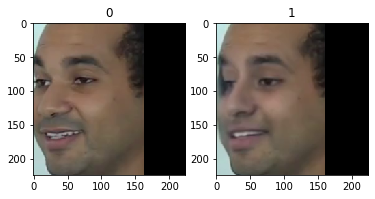

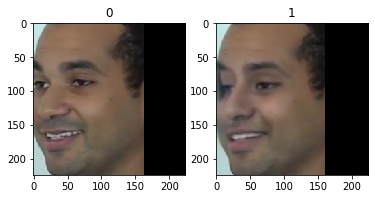

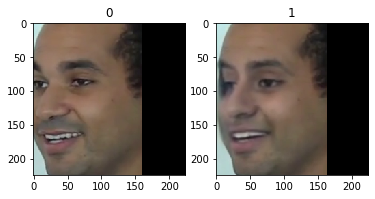

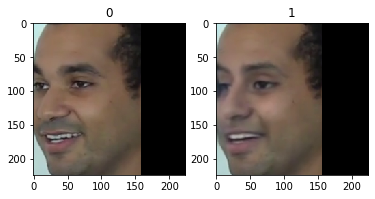

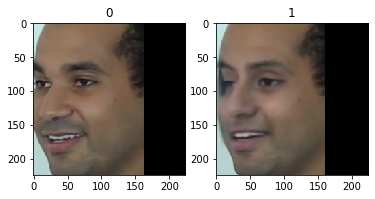

...

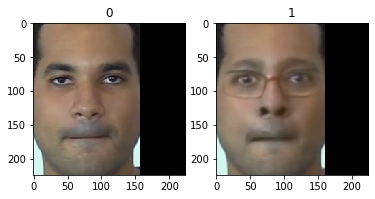

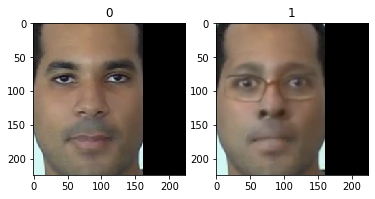

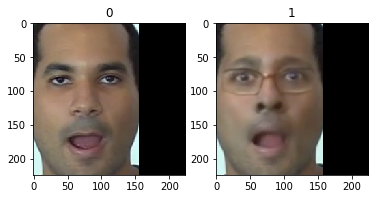

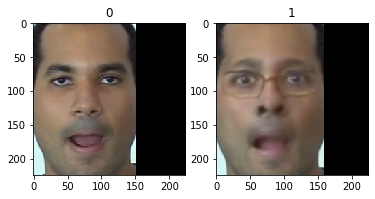

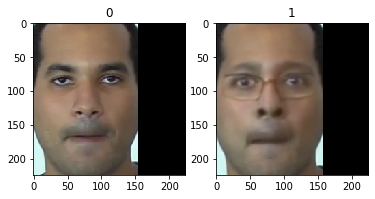

In [79]:
for i in range(int(len(face_objects)/2)):
    idx = i * 2
    for x in range(10):
        if len(face_objects[idx]['face_224_224']) > 0:
            plt.subplot(1, 2, 1)
            plt.title(face_objects[idx]['annotation'])
            plt.imshow(face_objects[idx]['face_224_224'][x * 5])
            plt.subplot(1, 2, 2)
            plt.title(face_objects[idx+1]['annotation'])
            plt.imshow(face_objects[idx+1]['face_224_224'][x * 5])
            plt.show()

In [75]:
face_objects[idx]['face_224_224'][x * 5]

IndexError: list index out of range

{'faces': [],
 'annotation': 0,
 'filename': '../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\dvzazyccgb.mp4',
 'face_224_224': []}

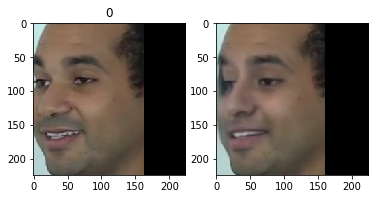

In [68]:
plt.subplot(1, 2, 1)
plt.title(0)
plt.imshow(face_objects[0]['face_224_224'][x * 5])
plt.subplot(1, 2, 2)
plt.imshow(face_objects[1]['face_224_224'][x * 5])
plt.show()

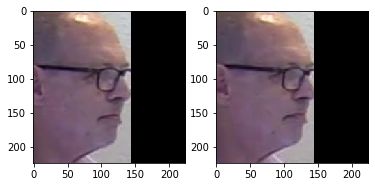

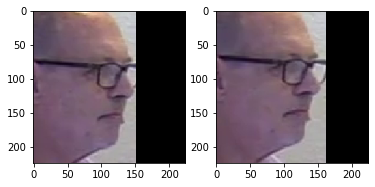

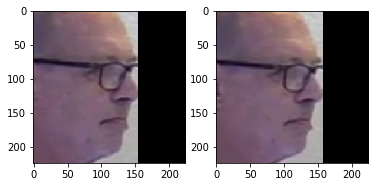

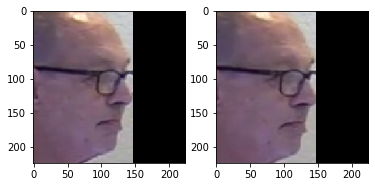

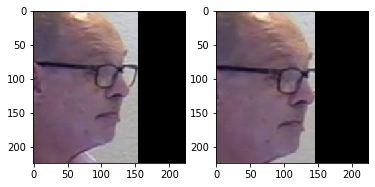

...

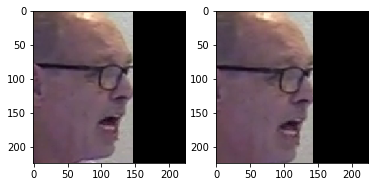

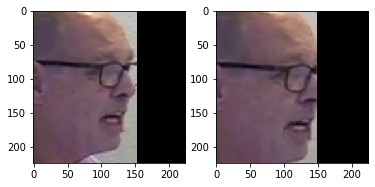

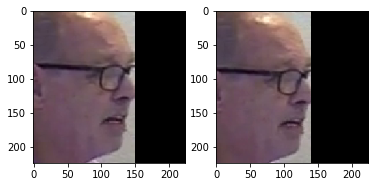

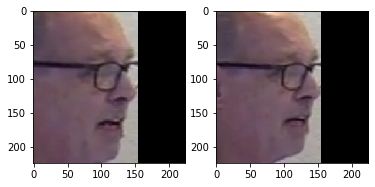

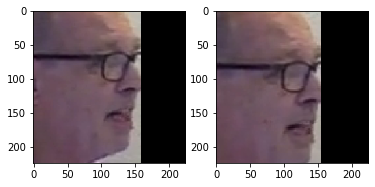

In [95]:
idx = int(round((np.argmax(signal)/48000)*30))
idx = 100
for x in range(40):
    plt.subplot(1, 2, 1)
    plt.imshow(face_objects[0]['face_224_224'][x * 5])
    plt.subplot(1, 2, 2)
    plt.imshow(face_objects[1]['face_224_224'][x * 5])
    plt.show()

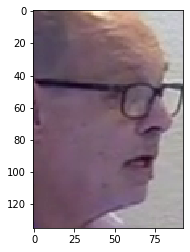

In [84]:
plt.imshow(face_objects[1]['faces'][idx])

In [76]:
face_objects[1].keys()

dict_keys(['faces', 'annotation', 'filename', 'face_224_224'])

In [78]:
print(face_objects[0]['annotation'])
print(face_objects[1]['annotation'])

0
1


In [44]:
len(face_objects[0]['faces'])/30

10.0

In [50]:
int(round((np.argmax(signal)/48000)*30))

167

In [41]:
np.argmax(signal[48000*5:48000*6])

26709

In [96]:
with open(join('../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\', 'metadata.json')) as json_file:
    metadata = json.load(json_file)

In [101]:
metadata['eindiyyyec.mp4']

{'label': 'FAKE', 'split': 'train', 'original': 'gphegnhvqj.mp4'}

In [61]:
metadata['yojgjueqta.mp4']

{'label': 'FAKE', 'split': 'train', 'original': 'gpdtoamvkz.mp4'}

In [110]:
[x for x in all_videos_annotations if 'gpdtoamvkz' in x[0]]

[['../deepfake_train_full\\dfdc_train_part_26\\dfdc_train_part_26\\gpdtoamvkz.mp4',
  0],
 ['../deepfake_train_full\\dfdc_train_part_26\\dfdc_train_part_26\\gpdtoamvkz.mp4',
  0],
 ['../deepfake_train_full\\dfdc_train_part_26\\dfdc_train_part_26\\gpdtoamvkz.mp4',
  0],
 ['../deepfake_train_full\\dfdc_train_part_26\\dfdc_train_part_26\\gpdtoamvkz.mp4',
  0],
 ['../deepfake_train_full\\dfdc_train_part_26\\dfdc_train_part_26\\gpdtoamvkz.mp4',
  0]]

In [15]:
spf = wave.open('../deepfake_train_full_audio\\aqsgzoxyok.wav')
signal = spf.readframes(-1)

In [17]:
spf.getframerate()

48000

In [16]:
signal

b'\x03\x00\x19\x00\x1b\x00\x18\x00\x14\x00\x17\x00&\x00\x1b\x00\xfa\xff\xfe\xff\x13\x00\x0b\x00\x06\x00\x12\x00\n\x00\xf7\xff\xf9\xff\x07\x00\n\x00\xfb\xff\xf6\xff\x05\x00\xf9\xff\xda\xff\xe0\xff\xf3\xff\xe3\xff\xd3\xff\xdd\xff\xe4\xff\xdd\xff\xdc\xff\xf0\xff\xfa\xff\xe2\xff\xd3\xff\xed\xff\xf6\xff\xd8\xff\xd8\xff\xf6\xff\xf6\xff\xee\xff\x00\x00\x02\x00\xee\xff\xf2\xff\xff\xff\xef\xff\xda\xff\xdd\xff\xea\xff\xf4\xff\xfa\xff\xf7\xff\xf6\xff\x00\x00\n\x00\x13\x00\x1c\x00\x0f\x00\xf9\xff\xfd\xff\x10\x00\x1b\x00\x1c\x00\n\x00\xeb\xff\xe6\xff\xea\xff\xd9\xff\xd3\xff\xe1\xff\xe0\xff\xd9\xff\xdf\xff\xcd\xff\xae\xff\xc2\xff\xe9\xff\xde\xff\xba\xff\xb3\xff\xc0\xff\xce\xff\xdd\xff\xe3\xff\xd9\xff\xc8\xff\xc4\xff\xd2\xff\xd4\xff\xc0\xff\xba\xff\xcc\xff\xd5\xff\xcd\xff\xc4\xff\xba\xff\xae\xff\xad\xff\xab\xff\x90\xff}\xff\x9f\xff\xc2\xff\xa9\xff\x8f\xff\xa5\xff\xb2\xff\xaa\xff\xbb\xff\xc8\xff\xb2\xff\xb4\xff\xd5\xff\xd4\xff\xc3\xff\xd6\xff\xe6\xff\xce\xff\xbf\xff\xd6\xff\xe7\xff\xdd\xff\xd9\xff\xf0

In [18]:
len(signal)/48000

20.010666666666665

In [27]:
face_objects[0]

{'faces': [],
 'annotation': 1,
 'filename': '../deepfake_train_full\\dfdc_train_part_46\\dfdc_train_part_46\\aqsgzoxyok.mp4',
 'face_224_224': []}

In [ ]:
signal

In [9]:
from scipy.io.wavfile import read, write

In [30]:
read('../deepfake_train_full\\dfdc_train_part_26\\dfdc_train_part_26\\ptexzwohvg.mp4')

NameError: name 'read' is not defined

In [35]:
import sys
from moviepy.editor import *

video = VideoFileClip('../deepfake_train_full\\dfdc_train_part_46\\dfdc_train_part_46\\aqsgzoxyok.mp4') # 2.
audio = video.audio # 3.

RuntimeError: imageio.ffmpeg.download() has been deprecated. Use 'pip install imageio-ffmpeg' instead.'

In [ ]:
'../deepfake_train_full\\dfdc_train_part_46\\dfdc_train_part_46\\aqsgzoxyok.mp4'

In [36]:
v_cap = FileVideoStream('../deepfake_train_full\\dfdc_train_part_46\\dfdc_train_part_46\\aqsgzoxyok.mp4')

In [37]:
t = v_cap.start()

False

In [111]:
[x for x in all_videos if 'gpdtoamvkz' in x[0]]

[['../deepfake_train_full\\dfdc_train_part_26\\dfdc_train_part_26\\gpdtoamvkz.mp4',
  0]]

In [112]:
len([x for x in all_videos if '_42' in x[0]])

2384

In [20]:
[x for x in all_videos_annotations if '_42' in x[0]][:10]

[['../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\eekftvuvcl.mp4',
  1],
 ['../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\crnfdbnpjz.mp4',
  1],
 ['../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\xqitshdinv.mp4',
  1],
 ['../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\uqzgsfqjxw.mp4',
  1],
 ['../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\cnhpwzknts.mp4',
  1],
 ['../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\ebvanagxbt.mp4',
  1],
 ['../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\ffbjlbsudv.mp4',
  1],
 ['../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\pvujmqubwu.mp4',
  1],
 ['../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\mhtohpkfxk.mp4',
  1],
 ['../deepfake_train_full\\dfdc_train_part_42\\dfdc_train_part_42\\sknvycxyan.mp4',
  0]]